# ModConversion - Predecir conversión de usuarios - Tipo Inversor

## Notebook para probar diferentes configuraciones y obtener el modelo.
Este notebook lee los datos históricos de los usuarios de tipo Inversor, así como una serie de parámetros asociados al proceso de registro, recogida de datos por regulación y diferentes acciones realizadas por los usuarios antes de convertires en clientes. Con estos datos queremos poder predecir si el usuario se convertirá en cliente, y que probabilidad hay de que se produzca.

# 0. Configuración

In [1]:
import pandas as pd
from pycaret.classification import *
import datetime
import os
from boto3 import client

# 1. Carga de datos

In [2]:
dataset_raw = pd.read_csv('../datasets/dataset_ModConversion_investors.csv')
dataset_raw.head()

,user_currency,user_country,start_mifid_days,has_finished_mifid,finish_mifid_days,has_deposit,first_deposit_days,first_deposit_amount,first_deposit_platform,mifid_actual_savings,mifid_next_year_savings,mifid_qualifications,mifid_experience,mifid_money_other_brokers,mifid_invested_other_brokers,user_flow_name,first_trade_investor_account_demo_days,days_until_conversion_or_today,is_converted
0,EUR,22,0.0,0,NaN,0,NaN,0.0,1,9,12,0,0,0,0,3,NaN,1,0
1,USD,24,0.0,0,NaN,0,NaN,0.0,1,12,12,0,0,0,0,3,0.0,1,0
2,GBP,41,0.0,1,1.0,0,NaN,0.0,1,12,13,0,1,1,12,3,NaN,1,0
3,USD,24,0.0,0,NaN,0,NaN,0.0,1,6,8,1,1,1,13,3,NaN,2,0
4,USD,114,1.0,0,NaN,0,NaN,0.0,1,7,7,0,1,1,6,3,0.0,2,0


# 2. Iniciar PyCaret

A la hora de inicializar PyCaret solo hemos activado la normalización de los datos y configurado la columna que es el objetivo (label_num) y las columnas a ignorar.

In [3]:
clf1 = setup(dataset_raw, normalize=True, target = 'is_converted', categorical_features=['user_country'],  fix_imbalance=True, silent=True)

,Description,Value
0,session_id,3413
1,Target,is_converted
2,Target Type,Binary
3,Label Encoded,"0: 0, 1: 1"
4,Original Data,"(6720, 19)"
5,Missing Values,True
6,Numeric Features,6
7,Categorical Features,12
8,Ordinal Features,False
9,High Cardinality Features,False


# 3. Crear el modelo y elegir la mejor opción

In [4]:
top = compare_models(n_select=1, sort='Recall')

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
ridge,Ridge Classifier,0.9558,0.0000,0.9992,0.8520,0.9196,0.8894,0.8949,0.1890
lda,Linear Discriminant Analysis,0.9556,0.9934,0.9992,0.8514,0.9192,0.8889,0.8944,0.2940
lr,Logistic Regression,0.9855,0.9979,0.9882,0.9564,0.9719,0.9622,0.9625,1.1120
qda,Quadratic Discriminant Analysis,0.3268,0.5449,0.9857,0.2713,0.4254,0.0483,0.1401,0.2370
svm,SVM - Linear Kernel,0.9853,0.0000,0.9840,0.9594,0.9714,0.9615,0.9618,0.1990
gbc,Gradient Boosting Classifier,0.9866,0.9991,0.9832,0.9647,0.9737,0.9647,0.9649,1.1550
ada,Ada Boost Classifier,0.9885,0.9989,0.9806,0.9743,0.9773,0.9696,0.9698,0.4370
rf,Random Forest Classifier,0.9796,0.9979,0.9790,0.9428,0.9604,0.9467,0.9471,0.4820
lightgbm,Light Gradient Boosting Machine,0.9864,0.9990,0.9781,0.9685,0.9731,0.9640,0.9642,0.3160
et,Extra Trees Classifier,0.9775,0.9969,0.9706,0.9426,0.9562,0.9410,0.9414,0.5350


# 4. Ajustar hiperparámetros

In [5]:
top_tuned = tune_model(top, optimize='Recall')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9448,0.0000,1.0000,0.8207,0.9015,0.8637,0.8718
1,0.9554,0.0000,1.0000,0.8500,0.9189,0.8885,0.8940
2,0.9660,0.0000,1.0000,0.8815,0.9370,0.9139,0.9173
3,0.9532,0.0000,1.0000,0.8429,0.9147,0.8828,0.8889
4,0.9532,0.0000,1.0000,0.8429,0.9147,0.8828,0.8889
5,0.9532,0.0000,1.0000,0.8440,0.9154,0.8834,0.8894
6,0.9596,0.0000,1.0000,0.8623,0.9261,0.8985,0.9031
7,0.9617,0.0000,1.0000,0.8686,0.9297,0.9036,0.9078
8,0.9447,0.0000,0.9916,0.8252,0.9008,0.8629,0.8699
9,0.9702,0.0000,1.0000,0.8947,0.9444,0.9242,0.9268


## 4.1 Calibramos el modelo para mostrar la probabilidad

In [6]:
calibrated_dt = calibrate_model(top_tuned)

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,0.9469,0.9948,0.9496,0.8561,0.9004,0.8644,0.8665
1,0.9575,0.9970,0.9916,0.8613,0.9219,0.8929,0.8971
2,0.9724,0.9975,1.0000,0.9015,0.9482,0.9295,0.9318
3,0.9596,0.9971,0.9915,0.8667,0.9249,0.8974,0.9012
4,0.9574,0.9949,0.9831,0.8657,0.9206,0.8917,0.8951
5,0.9638,0.9953,0.9916,0.8806,0.9328,0.9082,0.9112
6,0.9574,0.9973,0.9748,0.8722,0.9206,0.8917,0.8943
7,0.9702,0.9961,0.9748,0.9134,0.9431,0.9229,0.9238
8,0.9532,0.9943,0.9748,0.8593,0.9134,0.8815,0.8848
9,0.9830,0.9986,0.9916,0.9440,0.9672,0.9557,0.9563


# 5. Probar modelo con datos de test

In [7]:
predict_new = predict_model(calibrated_dt)

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
0,Ridge Classifier,0.9623,0.9961,0.9898,0.8725,0.9275,0.9022,0.9054


In [8]:
predict_new

,start_mifid_days,finish_mifid_days,first_deposit_days,first_deposit_amount,first_trade_investor_account_demo_days,days_until_conversion_or_today,user_currency_EUR,user_currency_GBP,user_currency_USD,user_country_0.0,...,mifid_invested_other_brokers_7,mifid_invested_other_brokers_8,mifid_invested_other_brokers_9,user_flow_name_0,user_flow_name_1,user_flow_name_2,user_flow_name_3,is_converted,Label,Score
0,1.202007,2.730797e-09,4.506038e-09,-0.187864,7.381419e-01,-0.308047,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.9996
1,-0.246308,-4.529409e-01,-8.699673e-01,-0.105091,-4.609714e-09,-0.543134,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,1,0.9353
2,-0.246308,2.730797e-09,4.506038e-09,-0.187864,-4.609714e-09,-0.425591,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9993
3,-0.246308,2.730797e-09,4.506038e-09,-0.187864,-4.609714e-09,-0.798289,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0,0,0.9994
4,-0.246308,2.730797e-09,4.506038e-09,-0.187864,-4.609714e-09,1.073803,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9999
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2012,-0.246308,-4.529409e-01,4.506038e-09,-0.187864,-3.819407e-01,0.821515,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9998
2013,-0.246308,-4.409598e-01,-8.556494e-01,-0.071981,-3.310278e-01,-1.153785,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1,1,0.9804
2014,-0.246308,-4.289786e-01,4.506038e-09,-0.187864,-4.609714e-09,1.340425,0.0,0.0,1.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0,0,0.9999
2015,-0.246308,-3.690729e-01,-6.981530e-01,0.143230,-4.609714e-09,-1.122249,1.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1,1,0.9938


 # 6. Mostrar información del modelo

## 6.1 Precision Recall Curve

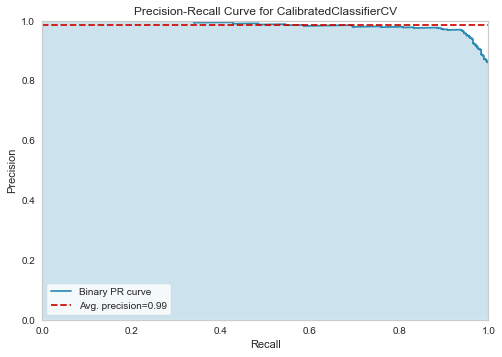

In [9]:
plot_model(calibrated_dt, plot='pr')

## 6.2 Confusion Matrix

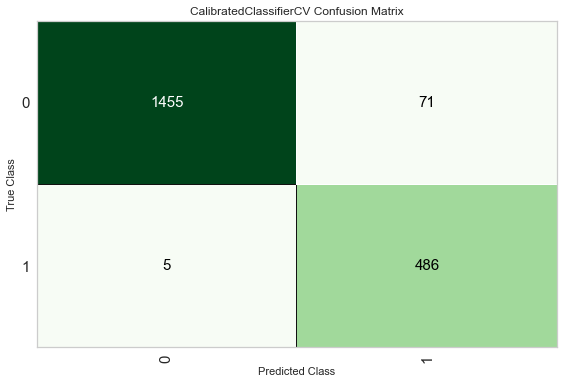

In [10]:
plot_model(calibrated_dt, plot='confusion_matrix')

## 6.3 Class Prediction Error

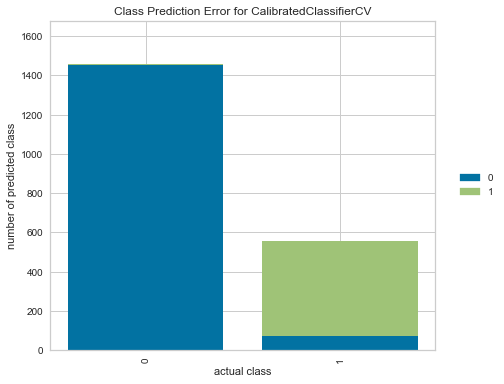

In [11]:
plot_model(calibrated_dt, plot='error')

## 6.4 Classification Report

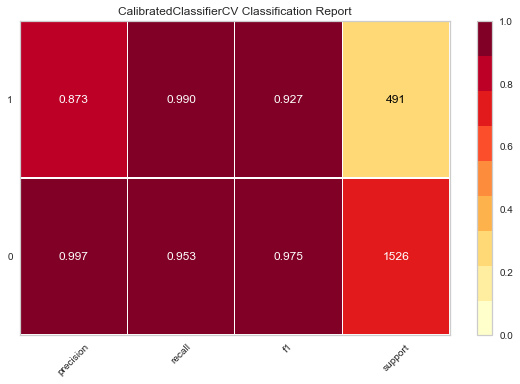

In [12]:
plot_model(calibrated_dt, plot='class_report')

## 6.5 Learning Curve

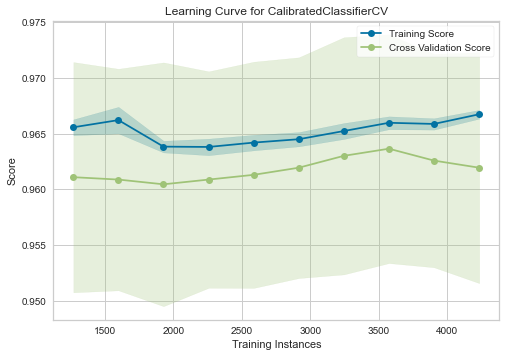

In [13]:
plot_model(calibrated_dt, plot='learning')

## 6.6 Feature Importance

El modelo calibrado no permite representar esta grafica, por lo que utilizamos el modelo justo antes de calibrarlo.

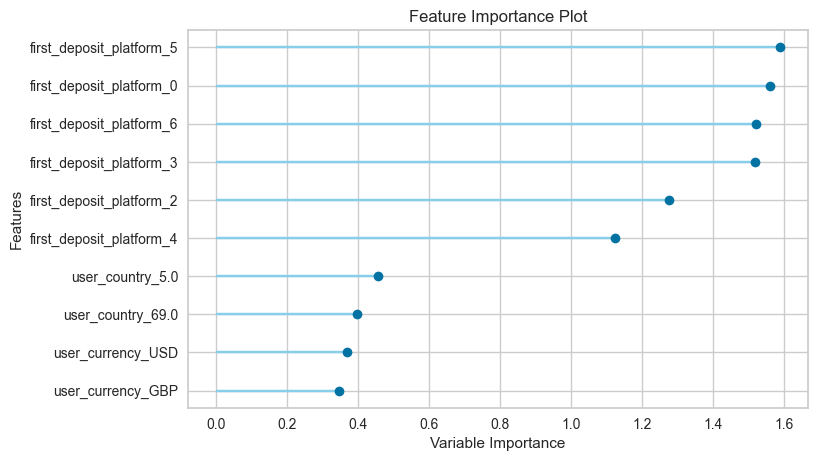

In [14]:
plot_model(top_tuned, plot='feature')

## 6.7 Area Under the Curve

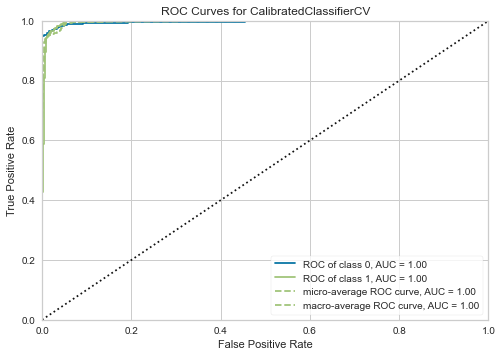

In [15]:
try:
    plot_model(calibrated_dt, plot='auc')
except Exception as ex:
    print("This model can't measure auc.")

 # 7. Finalizar y guardar modelo

In [16]:
final_model = finalize_model(calibrated_dt)

In [17]:
save_model(final_model, model_name='ModConversion', verbose=False)
#S3.upload_file('ModConversion.pkl', 'tfm-2021-darwinex', 'models/ModConversion/investor/final_model.pkl')
#S3.upload_file('ModConversion.pkl', 'tfm-2021-darwinex', 'models/ModConversion/investor/history/{}_model'.format(datetime.datetime.now()))

(Pipeline(memory=None,
          steps=[('dtypes',
                  DataTypes_Auto_infer(categorical_features=['user_country'],
                                       display_types=False, features_todrop=[],
                                       id_columns=[],
                                       ml_usecase='classification',
                                       numerical_features=[],
                                       target='is_converted',
                                       time_features=[])),
                 ('imputer',
                  Simple_Imputer(categorical_strategy='not_available',
                                 fill_value_categorical=None,
                                 fill_value_numeric...
                 ('feature_select', 'passthrough'), ('fix_multi', 'passthrough'),
                 ('dfs', 'passthrough'), ('pca', 'passthrough'),
                 ['trained_model',
                  CalibratedClassifierCV(base_estimator=RidgeClassifier(alpha=2.33,
   